In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
pip install pyclarity

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 616.5/616.5 KB 11.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 KB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.8/145.8 KB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.4/112.4 KB 16.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.7/74.7 KB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.1/73.1 KB 12.1 MB/s eta 0:00:00
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141231 sha256=e47b7ae29dfdf1371f1b6eed697930e520a28bcb80d25dd2e79914571ffca520
  Stored in directory: /root/.cache/pip/wheels/c8/d0/ab/d43c02eaddc5b9004db86950802442ad9a26f279c619e28da0
  Created wheel for pystoi: filename=pystoi-0.

In [3]:
cd /content/drive/MyDrive/mygithub/clarity/

/content/drive/.shortcut-targets-by-id/1j0tKfNJ74iEAtyLmY4PY6L2fktF9jL1I/mygithub/clarity


In [4]:
pip install -e .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/drive/.shortcut-targets-by-id/1j0tKfNJ74iEAtyLmY4PY6L2fktF9jL1I/mygithub/clarity
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Attempting uninstall: pyclarity
    Found existing installation: pyclarity 0.2.1
    Uninstalling pyclarity-0.2.1:
      Successfully uninstalled pyclarity-0.2.1
  Running setup.py develop for pyclarity


In [5]:
%pip list


Package                       Version
----------------------------- ----------------------
absl-py                       1.3.0
aeppl                         0.0.33
aesara                        2.7.9
aiohttp                       3.8.3
aiosignal                     1.3.1
alabaster                     0.7.12
albumentations                1.2.1
altair                        4.2.0
antlr4-python3-runtime        4.8
appdirs                       1.4.4
arviz                         0.12.1
astor                         0.8.1
astropy                       4.3.1
astunparse                    1.6.3
async-timeout                 4.0.2
atari-py                      0.2.9
atomicwrites                  1.4.1
attrs                         22.2.0
audioread                     3.0.0
autograd                      1.5
Babel                         2.11.0
backcall                      0.2.0
beautifulsoup4                4.6.3
bleach                        5.0.1
blis                          0.7.9
bokeh   

In [6]:
from clarity.data import demo_data

demo_data.get_metadata_demo()

Downloading...
From: https://drive.google.com/uc?export=download&id=14KGm2GaRgwlrZvtmMwWTYu7itaRVQV8f
To: /content/drive/.shortcut-targets-by-id/1j0tKfNJ74iEAtyLmY4PY6L2fktF9jL1I/mygithub/clarity/data.tgz
100%|██████████| 676k/676k [00:00<00:00, 69.9MB/s]


In [7]:
ls

clarity/            docs/                pylint_audit.md  setup.cfg
clarity_data/       LICENSE              pyproject.toml   setup.py
claritySE-v1.ipynb  notebooks/           README.md        tests/
CODE_OF_CONDUCT.md  pyclarity.egg-info/  scenes/


In [8]:
import json

with open("clarity_data/demo/metadata/scenes.demo.json") as f:
    scenes = json.load(f)

with open("clarity_data/demo/metadata/rooms.demo.json") as f:
    rooms = json.load(f)

with open("clarity_data/demo/metadata/listeners.json") as f:
    listeners = json.load(f)

with open("clarity_data/demo/metadata/scenes_listeners.dev.json") as f:
    scenes_listeners = json.load(f)

In [9]:
scene_0 = scenes[0]

print(scene_0.keys())

dict_keys(['dataset', 'room', 'scene', 'target', 'duration', 'interferers', 'SNR', 'listener'])


In [10]:
print(scene_0["SNR"])

-9.2114


In [11]:
print(scene_0["duration"])

258945


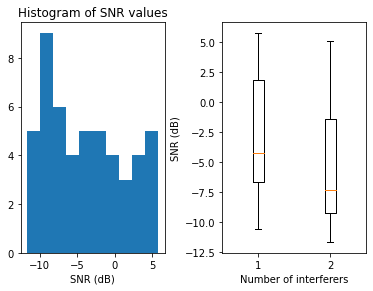

In [12]:
import numpy as np
from matplotlib import pyplot as plt

fig, ax = plt.subplots(1, 2)

# Get list of SNRs of scenes
snr_values = np.array([s["SNR"] for s in scenes], dtype="float32")

# Plot histogram
ax[0].hist(snr_values)
ax[0].set_title("Histogram of SNR values")
ax[0].set_xlabel("SNR (dB)")

# Get list of number of interferers in scenes
n_interferers = np.array([len(s["interferers"]) for s in scenes], dtype="int32")

# Prepare data for boxplot
snr_comparison_data = [
    [s for s, n in zip(snr_values, n_interferers) if n == 2],
    [s for s, n in zip(snr_values, n_interferers) if n == 3],
]

# Plot boxplot
ax[1].boxplot(np.array(snr_comparison_data, dtype="object"))
ax[1].set_xlabel("Number of interferers")
ax[1].set_ylabel("SNR (dB)")

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.4)

fig.show()

In [13]:
room_id = scene_0["room"]

# Iterate through rooms to find the one named `room_id`

room = next((item for item in rooms if item["name"] == room_id), None)

print(room["dimensions"])

3.8x3.0263x3.4


In [14]:
room_dict = {room["name"]: room for room in rooms}

In [15]:
room_id = scene_0["room"]
room_dict[room_id]
print(room["dimensions"])

3.8x3.0263x3.4



Scene number 32  (ID S06033) has room dimensions of 4.627x3.7x2.8

Simulated listeners for scene 32 have spatial attributes: 
{'position': [0.4, 2.4, 1.2], 'view_vector': [-0.447, -0.894, 0.0]}

Audiograms for listeners in Scene ID S06033


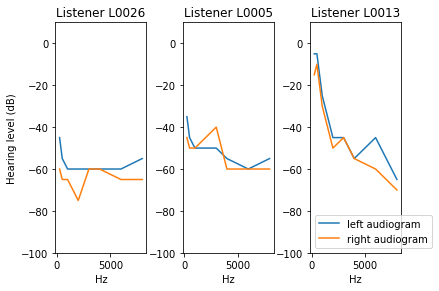

In [16]:
scene_no = 32  # this is just an arbitrary index. try any from 0 - 49

scene = scenes[scene_no]

room = room_dict[scene["room"]]
current_listeners = scenes_listeners[scene["scene"]]


print(
    f'\nScene number {scene_no}  (ID {scene["scene"]}) has room dimensions of {room["dimensions"]}'
)

print(
    f'\nSimulated listeners for scene {scene_no} have spatial attributes: \n{room["listener"]}'
)

print(f'\nAudiograms for listeners in Scene ID {scene["scene"]}')


fig, ax = plt.subplots(1, len(current_listeners))

ax[0].set_ylabel("Hearing level (dB)")
for i, l in enumerate(current_listeners):
    listener_data = listeners[l]
    (left_ag,) = ax[i].plot(
        listener_data["audiogram_cfs"],
        -np.array(listener_data["audiogram_levels_l"]),
        label="left audiogram",
    )
    (right_ag,) = ax[i].plot(
        listener_data["audiogram_cfs"],
        -np.array(listener_data["audiogram_levels_r"]),
        label="right audiogram",
    )
    ax[i].set_title(f"Listener {l}")
    ax[i].set_xlabel("Hz")
    ax[i].set_ylim([-100, 10])

plt.legend(handles=[left_ag, right_ag])
plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.4)

# Run Baseline

In [17]:
from clarity.data import demo_data

demo_data.get_metadata_demo()
demo_data.get_scenes_demo()

Downloading...
From: https://drive.google.com/uc?export=download&id=14KGm2GaRgwlrZvtmMwWTYu7itaRVQV8f
To: /content/drive/.shortcut-targets-by-id/1j0tKfNJ74iEAtyLmY4PY6L2fktF9jL1I/mygithub/clarity/data.tgz
100%|██████████| 676k/676k [00:00<00:00, 70.9MB/s]


Access denied with the following error:



 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?export=download&id=1PB0CfGXhpkYNk8HbE5lTWowm2016x6Hl 



In [18]:
# AFTER DOWNLOAD ABOVE FILE MANUALLY

!tar -xvzf clarity_data/scenes.tgz

scenes/S06001_hr.wav
scenes/S06001_interferer_CH0.wav
scenes/S06001_interferer_CH1.wav
scenes/S06001_interferer_CH2.wav
scenes/S06001_interferer_CH3.wav
scenes/S06001_mix_CH0.wav
scenes/S06001_mix_CH1.wav
scenes/S06001_mix_CH2.wav
scenes/S06001_mix_CH3.wav
scenes/S06001_target_CH0.wav
scenes/S06001_target_CH1.wav
scenes/S06001_target_CH2.wav
scenes/S06001_target_CH3.wav
scenes/S06001_target_anechoic_CH1.wav
scenes/S06002_hr.wav
scenes/S06002_interferer_CH0.wav
scenes/S06002_interferer_CH1.wav
scenes/S06002_interferer_CH2.wav
scenes/S06002_interferer_CH3.wav
scenes/S06002_mix_CH0.wav
scenes/S06002_mix_CH1.wav
scenes/S06002_mix_CH2.wav
scenes/S06002_mix_CH3.wav
scenes/S06002_target_CH0.wav
scenes/S06002_target_CH1.wav
scenes/S06002_target_CH2.wav
scenes/S06002_target_CH3.wav
scenes/S06002_target_anechoic_CH1.wav
scenes/S06003_hr.wav
scenes/S06003_interferer_CH0.wav
scenes/S06003_interferer_CH1.wav
scenes/S06003_interferer_CH2.wav
scenes/S06003_interferer_CH3.wav
scenes/S06003_mix_CH0.wav

In [19]:
from clarity.enhancer.compressor import Compressor
from clarity.enhancer.nalr import NALR

In [20]:
pwd

'/content/drive/.shortcut-targets-by-id/1j0tKfNJ74iEAtyLmY4PY6L2fktF9jL1I/mygithub/clarity'

In [21]:
from omegaconf import DictConfig, OmegaConf

cfg = OmegaConf.load("clarity/recipes/cec2/baseline/config.yaml")
assert type(cfg) == DictConfig

In [22]:
cfg.path["root"] = "clarity_data/demo"
cfg.path["metadata_dir"] = "${path.root}/metadata"
cfg.path["scenes_folder"] = "${path.root}/scenes"

In [23]:
enhancer = NALR(**cfg.nalr)
compressor = Compressor(**cfg.compressor)

In [24]:
import json

with open("clarity_data/demo/metadata/scenes.demo.json") as f:
    scene_metadata = json.load(f)

with open("clarity_data/demo/metadata/listeners.json") as f:
    listeners_metadata = json.load(f)

with open("clarity_data/demo/metadata/scenes_listeners.dev.json") as f:
    scene_listeners_metadata = json.load(f)

In [25]:
scene_index = 2

scene = scene_metadata[scene_index]

print(scene)

{'dataset': 'demo', 'room': 'R06027', 'scene': 'S06003', 'target': {'name': 'T013_AB4_00431', 'time_start': 71318, 'time_end': 247277}, 'duration': 291377, 'interferers': [{'position': 1, 'time_start': 0, 'time_end': 291377, 'type': 'music', 'name': '19/387419.low.mp3', 'offset': 1099661}, {'position': 2, 'time_start': 0, 'time_end': 291377, 'type': 'noise', 'name': 'CIN_kettle_019.wav', 'offset': 210829}, {'position': 3, 'time_start': 0, 'time_end': 291377, 'type': 'speech', 'name': 'scm_08784.wav', 'offset': 26078627}], 'SNR': -2.1404, 'listener': {'rotation': [{'sample': 67206.3886, 'angle': -150.8675}, {'sample': 76490.3886, 'angle': -139.1835}], 'hrir_filename': ['BuK-ED', 'BuK-BTE_fr', 'BuK-BTE_mid', 'BuK-BTE_rear']}}


In [26]:
scene_id = scene["scene"]

scene_listeners = scene_listeners_metadata[scene_id]

print(scene_listeners)

['L0066', 'L0051', 'L0077']


In [27]:
listener_choice = 2
listener_id = scene_listeners[listener_choice]
listener = listeners_metadata[listener_id]

In [28]:
print(listener)

{'name': 'L0077', 'audiogram_cfs': [250, 500, 1000, 2000, 3000, 4000, 6000, 8000], 'audiogram_levels_l': [30, 30, 25, 40, 50, 55, 65, 70], 'audiogram_levels_r': [30, 35, 30, 40, 50, 60, 50, 65]}


In [29]:
import os

from scipy.io import wavfile

fs, signal = wavfile.read(
    os.path.join(cfg.path.scenes_folder, f"{scene_id}_mix_CH1.wav")
)

signal = signal / 32768.0

In [30]:
from IPython.display import Audio
from IPython.display import display

fullPath = "/content/drive/MyDrive/mygithub/clarity/clarity_data/demo/scenes/"
audioFile = fullPath + f"{scene_id}_mix_CH1.wav"
wn = Audio(audioFile, autoplay=True) ##
display(wn)

In [31]:
ws = Audio(signal.T, rate=fs, autoplay=True,normalize=True)
display(ws)

In [32]:
audioFile

'/content/drive/MyDrive/mygithub/clarity/clarity_data/demo/scenes/S06003_mix_CH1.wav'

In [33]:
pwd

'/content/drive/.shortcut-targets-by-id/1j0tKfNJ74iEAtyLmY4PY6L2fktF9jL1I/mygithub/clarity'

In [34]:
cfg.path.scenes_folder

'clarity_data/demo/scenes'

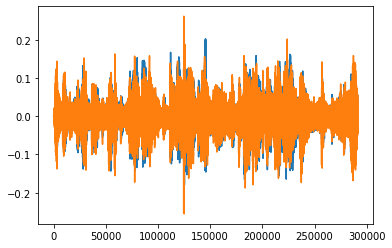

In [35]:
import matplotlib.pylab as plt

plt.plot(signal)

In [36]:
signal.shape

(291632, 2)

In [37]:
fs

44100

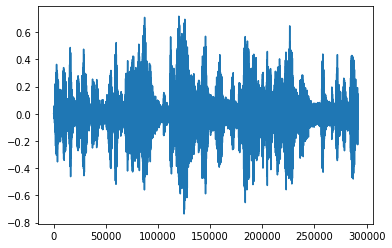

In [38]:
import numpy as np

nalr_fir, _ = enhancer.build(listener["audiogram_levels_l"], listener["audiogram_cfs"])
out_l = enhancer.apply(nalr_fir, signal[:, 0])

nalr_fir, _ = enhancer.build(listener["audiogram_levels_r"], listener["audiogram_cfs"])
out_r = enhancer.apply(nalr_fir, signal[:, 1])

plt.plot(out_l)

In [39]:
ws_out_l = Audio(out_l.T, rate=fs, autoplay=True,normalize=True)
display(ws_out_l)

In [40]:
ws_out_r = Audio(out_r.T, rate=fs, autoplay=True,normalize=True)
display(ws_out_r)

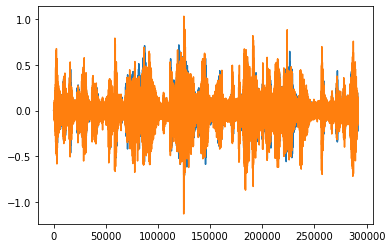

In [41]:
out_l, _, _ = compressor.process(out_l)
out_r, _, _ = compressor.process(out_r)

enhanced_audio = np.stack([out_l, out_r], axis=1)

plt.plot(enhanced_audio)

In [42]:
ws_enhanced_audio = Audio(enhanced_audio.T, rate=fs, autoplay=True)
display(ws_enhanced_audio)

7 samples clipped


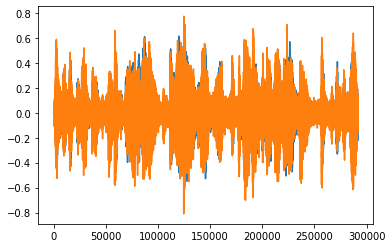

In [43]:
n_clipped = np.sum(np.abs(enhanced_audio) > 1.0)
if n_clipped > 0:
    print(f"{n_clipped} samples clipped")
enhanced_audio = np.tanh(enhanced_audio)
np.clip(enhanced_audio, -1.0, 1.0, out=enhanced_audio)

plt.plot(enhanced_audio)

In [44]:
ws_enhanced_audio_tahn = Audio(enhanced_audio.T, rate=fs, autoplay=True)
display(ws_enhanced_audio_tahn)

In [45]:
signal_16 = (32768.0 * enhanced_audio).astype(np.int16)

In [46]:
filename = f"{scene['scene']}_{listener['name']}_HA-output.wav"

In [47]:
from clarity.evaluator.haspi import haspi_v2_be
from clarity.evaluator.hasqi import hasqi_v2_better_ear

In [48]:
fs, reference = wavfile.read(
    os.path.join(cfg.path.scenes_folder, f"{scene_id}_target_CH1.wav")
)
reference = reference / 32768.0

In [49]:
ws_reference = Audio(reference.T, rate=fs, autoplay=True, normalize=True)
display(ws_reference)

In [50]:
sii_unprocessed = haspi_v2_be(
    reference[:, 0],
    reference[:, 1],
    signal[:, 0],
    signal[:, 1],
    fs_signal=fs,
    audiogram_left=listener["audiogram_levels_l"],
    audiogram_right=listener["audiogram_levels_r"],
    audiogram_cfs=listener["audiogram_cfs"],
)

sii_enhanced = haspi_v2_be(
    reference[:, 0],
    reference[:, 1],
    enhanced_audio[:, 0],
    enhanced_audio[:, 1],
    fs_signal=fs,
    audiogram_left=listener["audiogram_levels_l"],
    audiogram_right=listener["audiogram_levels_r"],
    audiogram_cfs=listener["audiogram_cfs"],
)

sii_ref = haspi_v2_be(
    reference[:, 0],
    reference[:, 1],
    reference[:, 0],
    reference[:, 1],
    fs_signal=fs,
    audiogram_left=listener["audiogram_levels_l"],
    audiogram_right=listener["audiogram_levels_r"],
    audiogram_cfs=listener["audiogram_cfs"],
)

print(f"Original audio HASPI score is {sii_unprocessed}")

print(f"Enhanced audio HASPI score is {sii_enhanced}")

print(f"Ref. audio HASPI score is {sii_ref}")

print(f"Improvement from processing is {sii_enhanced-sii_unprocessed}")

Original audio HASPI score is [0.18617535]
Enhanced audio HASPI score is [0.36312091]
Ref. audio HASPI score is [0.7149272]
Improvement from processing is [0.17694556]


In [51]:
siiq_unprocessed = hasqi_v2_better_ear(
    reference[:, 0],
    reference[:, 1],
    signal[:, 0],
    signal[:, 1],
    sample_freq=fs,
    audiogram_left=listener["audiogram_levels_l"],
    audiogram_right=listener["audiogram_levels_r"],
    audiogram_frequencies=listener["audiogram_cfs"],
)

siiq_enhanced = hasqi_v2_better_ear(
    reference[:, 0],
    reference[:, 1],
    enhanced_audio[:, 0],
    enhanced_audio[:, 1],
    sample_freq=fs,
    audiogram_left=listener["audiogram_levels_l"],
    audiogram_right=listener["audiogram_levels_r"],
    audiogram_frequencies=listener["audiogram_cfs"],
)

siiq_ref = hasqi_v2_better_ear(
    reference[:, 0],
    reference[:, 1],
    reference[:, 0],
    reference[:, 1],
    sample_freq=fs,
    audiogram_left=listener["audiogram_levels_l"],
    audiogram_right=listener["audiogram_levels_r"],
    audiogram_frequencies=listener["audiogram_cfs"],
)

print(f"Original audio HASQI score is {siiq_unprocessed}")

print(f"Enhanced audio HASQI score is {siiq_enhanced}")

print(f"Ref. audio HASQI score is {siiq_ref}")

print(f"Improvement from processing is {siiq_enhanced-siiq_unprocessed}")

Original audio HASQI score is 0.10235870186245298
Enhanced audio HASQI score is 0.11768766495879875
Ref. audio HASQI score is 0.5044132282988523
Improvement from processing is 0.015328963096345766


In [52]:
listener["audiogram_cfs"]

[250, 500, 1000, 2000, 3000, 4000, 6000, 8000]

In [53]:
listener["audiogram_levels_l"]

[30, 30, 25, 40, 50, 55, 65, 70]

In [54]:
audio_normal = [0, 0, 0, 0, 0, 0, 0, 0]

sii_unprocessed = haspi_v2_be(
    reference[:, 0],
    reference[:, 1],
    signal[:, 0],
    signal[:, 1],
    fs_signal=fs,
    audiogram_left=audio_normal,
    audiogram_right=audio_normal,
    audiogram_cfs=listener["audiogram_cfs"],
)

sii_enhanced = haspi_v2_be(
    reference[:, 0],
    reference[:, 1],
    enhanced_audio[:, 0],
    enhanced_audio[:, 1],
    fs_signal=fs,
    audiogram_left=audio_normal,
    audiogram_right=audio_normal,
    audiogram_cfs=listener["audiogram_cfs"],
)

sii_ref = haspi_v2_be(
    reference[:, 0],
    reference[:, 1],
    reference[:, 0],
    reference[:, 1],
    fs_signal=fs,
    audiogram_left=audio_normal,
    audiogram_right=audio_normal,
    audiogram_cfs=listener["audiogram_cfs"],
)

print(f"Original audio HASPI score is {sii_unprocessed}")

print(f"Enhanced audio HASPI score is {sii_enhanced}")

print(f"Ref. audio HASPI score is {sii_ref}")

print(f"Improvement from processing is {sii_enhanced-sii_unprocessed}")


sii_unprocessed = hasqi_v2_better_ear(
    reference[:, 0],
    reference[:, 1],
    signal[:, 0],
    signal[:, 1],
    sample_freq=fs,
    audiogram_left=audio_normal,
    audiogram_right=audio_normal,
    audiogram_frequencies=listener["audiogram_cfs"],
)

sii_enhanced = hasqi_v2_better_ear(
    reference[:, 0],
    reference[:, 1],
    enhanced_audio[:, 0],
    enhanced_audio[:, 1],
    sample_freq=fs,
    audiogram_left=audio_normal,
    audiogram_right=audio_normal,
    audiogram_frequencies=listener["audiogram_cfs"],
)

sii_ref = hasqi_v2_better_ear(
    reference[:, 0],
    reference[:, 1],
    reference[:, 0],
    reference[:, 1],
    sample_freq=fs,
    audiogram_left=audio_normal,
    audiogram_right=audio_normal,
    audiogram_frequencies=listener["audiogram_cfs"],
)

print(f"Original audio HASQI score is {sii_unprocessed}")

print(f"Enhanced audio HASQI score is {sii_enhanced}")

print(f"Ref. audio HASQI score is {sii_ref}")

print(f"Improvement from processing is {sii_enhanced-sii_unprocessed}")

Original audio HASPI score is [0.6417671]
Enhanced audio HASPI score is [0.61211575]
Ref. audio HASPI score is [0.9999861]
Improvement from processing is [-0.02965136]
Original audio HASQI score is 0.09589469574355187
Enhanced audio HASQI score is 0.07827333616919736
Ref. audio HASQI score is 0.9991894099227967
Improvement from processing is -0.01762135957435451


# check the performance of TinyLSTM paper

https://github.com/Bose/efficient-neural-speech-enhancement



In [55]:
dirty_tinyLstm_path = "/content/drive/MyDrive/mygithub/efficient-neural-speech-enhancement/audio/skip_rnn_pruned_and_quantized/9/445c020u/dirty.wav"
enhanced_tinyLstm_path = "/content/drive/MyDrive/mygithub/efficient-neural-speech-enhancement/audio/skip_rnn_pruned_and_quantized/9/445c020u/proc.wav"
ref_tinyLstm_path = "/content/drive/MyDrive/mygithub/efficient-neural-speech-enhancement/audio/skip_rnn_pruned_and_quantized/9/445c020u/clean.wav"

fsTiny, dirtyTiny = wavfile.read(dirty_tinyLstm_path)
fsTiny, enhTiny = wavfile.read(enhanced_tinyLstm_path)
fsTiny, refTiny = wavfile.read(ref_tinyLstm_path)

print("Dirty Audio")
dirtyTinyAudio = Audio(dirtyTiny.T, rate=fsTiny, autoplay=True)
display(dirtyTinyAudio)

print("Enhanced Audio")
enhTinyAudio = Audio(enhTiny.T, rate=fsTiny, autoplay=True)
display(enhTinyAudio)

print("Clean Audio")
refTinyAudio = Audio(refTiny.T, rate=fsTiny, autoplay=True)
display(dirtyTinyAudio)


fsTiny

#signal = signal / 32768.0

Dirty Audio


Enhanced Audio


Clean Audio


16000

In [56]:
dirtyTiny.shape

(61187, 2)

In [57]:
enhTiny.shape

(61100,)

In [58]:
refTiny.shape

(61187,)

In [59]:
sii_enhanced_tinylstm_org = haspi_v2_be(
    refTiny,
    refTiny,
    dirtyTiny[:,0],
    dirtyTiny[:,1],
    fs_signal=fsTiny,
    audiogram_left=audio_normal,
    audiogram_right=audio_normal,
    audiogram_cfs=listener["audiogram_cfs"],
)

siiq_enhanced_tinylstm_org = hasqi_v2_better_ear(
    refTiny,
    refTiny,
    dirtyTiny[:,0],
    dirtyTiny[:,1],
    sample_freq=fsTiny,
    audiogram_left=audio_normal,
    audiogram_right=audio_normal,
    audiogram_frequencies=listener["audiogram_cfs"],
)

sii_enhanced_tinylstm = haspi_v2_be(
    refTiny,
    refTiny,
    enhTiny,
    enhTiny,
    fs_signal=fsTiny,
    audiogram_left=audio_normal,
    audiogram_right=audio_normal,
    audiogram_cfs=listener["audiogram_cfs"],
)

siiq_enhanced_tinylstm = hasqi_v2_better_ear(
    refTiny,
    refTiny,
    enhTiny,
    enhTiny,
    sample_freq=fsTiny,
    audiogram_left=audio_normal,
    audiogram_right=audio_normal,
    audiogram_frequencies=listener["audiogram_cfs"],
)


print("---- HASQI----")
print(f"Original audio HASQI score is {siiq_enhanced_tinylstm_org}")

print(f"Enhanced audio HASQI score is {siiq_enhanced_tinylstm}")

print(f"Improvement from processing is {siiq_enhanced_tinylstm-siiq_enhanced_tinylstm_org}")

print("---- HASPI----")

print(f"Original audio HASPI score is {sii_enhanced_tinylstm_org}")

print(f"Enhanced audio HASPI score is {sii_enhanced_tinylstm}")

print(f"Improvement from processing is {sii_enhanced_tinylstm-sii_enhanced_tinylstm_org}")

---- HASQI----
Original audio HASQI score is 0.25934538824568687
Enhanced audio HASQI score is 0.5584248755593029
Improvement from processing is 0.299079487313616
---- HASPI----
Original audio HASPI score is [0.92889337]
Enhanced audio HASPI score is [0.99717825]
Improvement from processing is [0.06828488]


In [60]:
dirty_tinyLstm_path = "/content/drive/MyDrive/mygithub/efficient-neural-speech-enhancement/audio/skip_rnn_pruned_and_quantized/-3/440c0403/dirty.wav"
enhanced_tinyLstm_path = "/content/drive/MyDrive/mygithub/efficient-neural-speech-enhancement/audio/skip_rnn_pruned_and_quantized/-3/440c0403/proc.wav"
ref_tinyLstm_path = "/content/drive/MyDrive/mygithub/efficient-neural-speech-enhancement/audio/skip_rnn_pruned_and_quantized/-3/440c0403/clean.wav"

fsTiny, dirtyTiny = wavfile.read(dirty_tinyLstm_path)
fsTiny, enhTiny = wavfile.read(enhanced_tinyLstm_path)
fsTiny, refTiny = wavfile.read(ref_tinyLstm_path)

print("Dirty Audio")
dirtyTinyAudio = Audio(dirtyTiny.T, rate=fsTiny, autoplay=True)
display(dirtyTinyAudio)

print("Enhanced Audio")
enhTinyAudio = Audio(enhTiny.T, rate=fsTiny, autoplay=True)
display(enhTinyAudio)

print("Clean Audio")
refTinyAudio = Audio(refTiny.T, rate=fsTiny, autoplay=True)
display(refTinyAudio)


fsTiny

#signal = signal / 32768.0

Dirty Audio


Enhanced Audio


Clean Audio


16000

In [61]:
sii_enhanced_tinylstm_org = haspi_v2_be(
    refTiny,
    refTiny,
    dirtyTiny[:,0],
    dirtyTiny[:,1],
    fs_signal=fsTiny,
    audiogram_left=audio_normal,
    audiogram_right=audio_normal,
    audiogram_cfs=listener["audiogram_cfs"],
)

siiq_enhanced_tinylstm_org = hasqi_v2_better_ear(
    refTiny,
    refTiny,
    dirtyTiny[:,0],
    dirtyTiny[:,1],
    sample_freq=fsTiny,
    audiogram_left=audio_normal,
    audiogram_right=audio_normal,
    audiogram_frequencies=listener["audiogram_cfs"],
)

sii_enhanced_tinylstm = haspi_v2_be(
    refTiny,
    refTiny,
    enhTiny,
    enhTiny,
    fs_signal=fsTiny,
    audiogram_left=audio_normal,
    audiogram_right=audio_normal,
    audiogram_cfs=listener["audiogram_cfs"],
)

siiq_enhanced_tinylstm = hasqi_v2_better_ear(
    refTiny,
    refTiny,
    enhTiny,
    enhTiny,
    sample_freq=fsTiny,
    audiogram_left=audio_normal,
    audiogram_right=audio_normal,
    audiogram_frequencies=listener["audiogram_cfs"],
)


print("---- HASQI----")
print(f"Original audio HASQI score is {siiq_enhanced_tinylstm_org}")

print(f"Enhanced audio HASQI score is {siiq_enhanced_tinylstm}")

print(f"Improvement from processing is {siiq_enhanced_tinylstm-siiq_enhanced_tinylstm_org}")

print("---- HASPI----")

print(f"Original audio HASPI score is {sii_enhanced_tinylstm_org}")

print(f"Enhanced audio HASPI score is {sii_enhanced_tinylstm}")

print(f"Improvement from processing is {sii_enhanced_tinylstm-sii_enhanced_tinylstm_org}")

---- HASQI----
Original audio HASQI score is 0.1363769369711949
Enhanced audio HASQI score is 0.40272804763783215
Improvement from processing is 0.26635111066663725
---- HASPI----
Original audio HASPI score is [0.90682501]
Enhanced audio HASPI score is [0.99875739]
Improvement from processing is [0.09193237]
